In [1]:
pip install scipy

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import f_oneway
from IPython.display import display, HTML
from IPython.display import display, Markdown
import warnings
warnings.filterwarnings("ignore")

In [3]:
def print(*args, sep=' ', end='\n', **kwargs):
    output = sep.join(map(str, args)) + end
    styled_output = f'<p style="font-size: 20px;">{output}</p>'
    display(HTML(styled_output))

In [4]:
Crime = pd.read_csv("datasets/Chicago_Crimes.csv")

In [5]:
Crime

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,13439321,JH237424,04/14/2024 12:00:00 AM,040XX S PRAIRIE AVE,0890,THEFT,FROM BUILDING,APARTMENT,False,False,...,3,38.0,06,1178707.0,1878256.0,2024,12/21/2024 03:40:46 PM,41.821236,-87.619921,"(41.821236024, -87.619920712)"
1,13437420,JH234779,04/14/2024 12:00:00 AM,023XX W CERMAK RD,2825,OTHER OFFENSE,HARASSMENT BY TELEPHONE,COMMERCIAL / BUSINESS OFFICE,False,False,...,25,31.0,26,1161210.0,1889347.0,2024,12/21/2024 03:40:46 PM,41.852052,-87.683801,"(41.852051675, -87.683800849)"
2,13428676,JH224478,04/14/2024 12:00:00 AM,043XX W LE MOYNE ST,0917,MOTOR VEHICLE THEFT,"CYCLE, SCOOTER, BIKE WITH VIN",STREET,False,False,...,36,23.0,07,1146960.0,1909501.0,2024,12/21/2024 03:40:46 PM,41.907640,-87.735587,"(41.907640473, -87.735587478)"
3,13429357,JH225293,04/14/2024 12:00:00 AM,039XX W ADAMS ST,143A,WEAPONS VIOLATION,UNLAWFUL POSSESSION - HANDGUN,STREET,True,False,...,28,26.0,15,1150158.0,1898721.0,2024,12/21/2024 03:40:46 PM,41.877997,-87.724121,"(41.877997275, -87.724120826)"
4,13430098,JH226395,04/14/2024 12:00:00 AM,011XX W 112TH PL,0890,THEFT,FROM BUILDING,RESIDENCE,False,False,...,21,75.0,06,1170856.0,1830157.0,2024,12/21/2024 03:40:46 PM,41.689421,-87.650123,"(41.6894214, -87.650123247)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249118,13805239,JJ217509,04/12/2025 12:00:00 AM,029XX W LOGAN BLVD,2826,OTHER OFFENSE,HARASSMENT BY ELECTRONIC MEANS,APARTMENT,False,False,...,1,22.0,26,1156478.0,1917149.0,2025,04/19/2025 03:41:24 PM,41.928440,-87.700416,"(41.928439867, -87.700415972)"
249119,13804023,JJ215813,04/12/2025 12:00:00 AM,094XX S HARVARD AVE,0430,BATTERY,AGGRAVATED - OTHER DANGEROUS WEAPON,STREET,False,False,...,9,49.0,04B,1175694.0,1842631.0,2025,04/19/2025 03:41:24 PM,41.723545,-87.632040,"(41.723545182, -87.632039508)"
249120,13803926,JJ215943,04/12/2025 12:00:00 AM,084XX S VINCENNES AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,False,True,...,21,71.0,08B,1173850.0,1848976.0,2025,04/19/2025 03:41:24 PM,41.740998,-87.638606,"(41.74099774, -87.638606337)"
249121,13803475,JJ215338,04/12/2025 12:00:00 AM,050XX S ABERDEEN ST,0530,ASSAULT,AGGRAVATED - OTHER DANGEROUS WEAPON,STREET,True,False,...,20,61.0,04A,1169838.0,1871348.0,2025,04/19/2025 03:41:24 PM,41.802477,-87.652657,"(41.802477219, -87.652657244)"


In [6]:
Crime['Location Description'] = Crime['Location Description'].fillna('unknown Location Description')
Crime['Community Area'] = Crime['Community Area'].fillna('unknown Community Area')
Crime['X Coordinate'] = Crime['X Coordinate'].fillna('unknown X Coordinate')
Crime['Y Coordinate'] = Crime['Y Coordinate'].fillna('unknown Y Coordinate')
Crime['Longitude'] = Crime['Longitude'].fillna('unknown Longitude')
Crime['Latitude'] = Crime['Latitude'].fillna(np.nan)
Crime['Location'] = Crime['Location'].fillna(np.nan)

In [7]:
Crime["Case Number"] = Crime["Case Number"].astype("category")
Crime["Block"] = Crime["Block"].astype("category")
Crime["IUCR"] = Crime["IUCR"].astype("category")
Crime["Primary Type"] = Crime["Primary Type"].astype("category")
Crime["Description"] = Crime["Description"].astype("category")
Crime["Location Description"] = Crime["Location Description"].astype("category")
Crime["District"] = Crime["District"].astype("category")
Crime["Ward"] = Crime["Ward"].astype("category")
Crime["FBI Code"] = Crime["FBI Code"].astype("category")
Crime["X Coordinate"] = Crime["X Coordinate"].astype("category")
Crime["Y Coordinate"] = Crime["Y Coordinate"].astype("category")
Crime["Year"] = Crime["Year"].astype("category")
Crime["Latitude"] = Crime["Latitude"].astype("category")
Crime["Longitude"] = Crime["Longitude"].astype("category")
Crime["Location"] = Crime["Location"].astype("category")


Crime['Date'] = pd.to_datetime(Crime['Date'], format='%m/%d/%Y %I:%M:%S %p' , errors="coerce")
Crime['Updated On'] = pd.to_datetime(Crime['Updated On'],  errors="coerce")

In [8]:
Crime.dtypes

ID                               int64
Case Number                   category
Date                    datetime64[ns]
Block                         category
IUCR                          category
Primary Type                  category
Description                   category
Location Description          category
Arrest                            bool
Domestic                          bool
Beat                             int64
District                      category
Ward                          category
Community Area                  object
FBI Code                      category
X Coordinate                  category
Y Coordinate                  category
Year                          category
Updated On              datetime64[ns]
Latitude                      category
Longitude                     category
Location                      category
dtype: object

# 3 INSIGTHS


# THEFT

# 1. Destribution of domestic theft that wast arrested

In [9]:
Crime_2024 = Crime[Crime['Year']==2024]
Domestic_2024 = Crime_2024[Crime_2024['Domestic']==True]
Arrest_2024 = Domestic_2024[Domestic_2024['Arrest']==True]
Theft_2024 = Arrest_2024[Arrest_2024['Primary Type']=='THEFT']

In [10]:
import folium
from folium.plugins import HeatMap

mymap = folium.Map(location=(41.75,-87.6), zoom_start=12)
locations = Theft_2024[['Latitude', 'Longitude']].dropna()

heat_data = [[row['Latitude'], row['Longitude']] for index, row in locations.iterrows()]
HeatMap(heat_data).add_to(mymap)

mymap

In [13]:
print("INSIGTHS")
print('Cases of domestic theft resulting in arrests—were concentrated primarily on Chicago’s South Side. The heatmap indicates a non-random pattern, with dense clusters extending into the West Side and some activity reaching north. These areas, likely influenced by urban density and socio-economic factors, warrant focused intervention.')

In [14]:
Theft_2024.nunique()

ID                      57
Case Number             57
Date                    57
Block                   56
IUCR                     3
Primary Type             1
Description              3
Location Description     9
Arrest                   1
Domestic                 1
Beat                    46
District                18
Ward                    32
Community Area          31
FBI Code                 1
X Coordinate            56
Y Coordinate            56
Year                     1
Updated On              11
Latitude                56
Longitude               56
Location                56
dtype: int64

# 2. Arrested theft count by district.

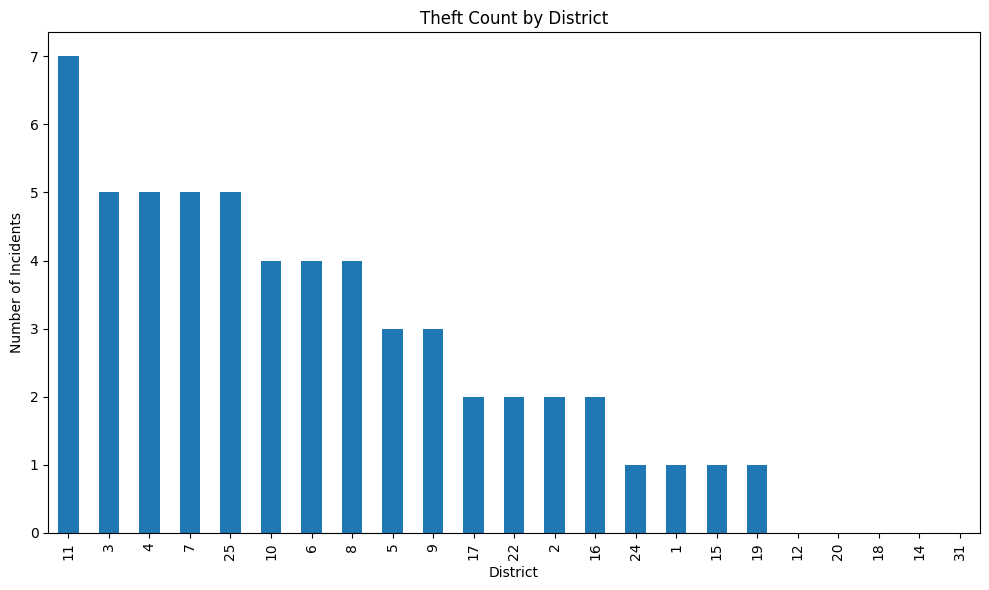

In [15]:
plt.figure(figsize=(10, 6))
Theft_2024['District'].value_counts().plot(kind='bar')
plt.title('Theft Count by District')
plt.xlabel('District')
plt.ylabel('Number of Incidents')
plt.tight_layout()
plt.show()

INSIGTHS

district 11 has most counts of arrested theft according to this vishualization.

# 3. Distribution of Theft in different location

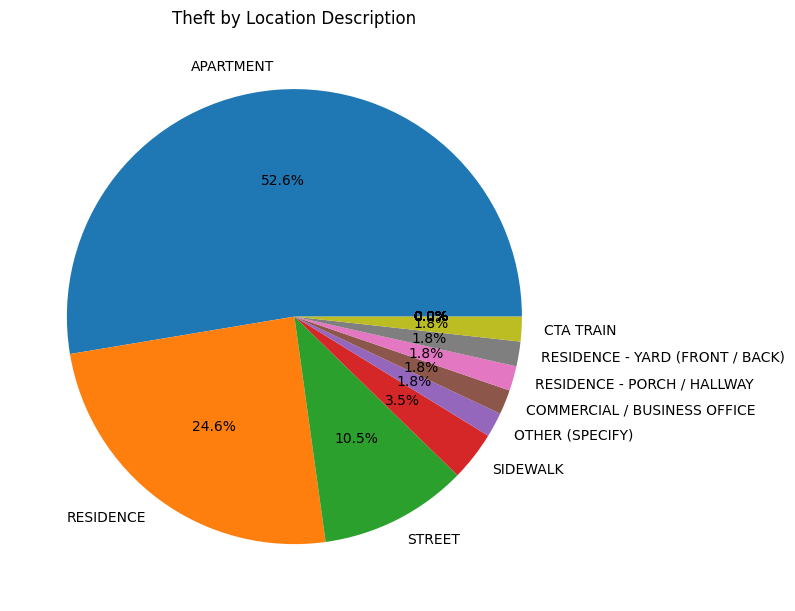

In [17]:
plt.figure(figsize=(8, 8))
Theft_2024['Location Description'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Theft by Location Description')
plt.ylabel('')
plt.tight_layout()
plt.show()

INSIGTHS

Apartments account for the highest number of theft-related arrests, making up 52.6% of such incidents, indicating they are more susceptible to theft.

# 4. Incidents of theft that is arrested over time

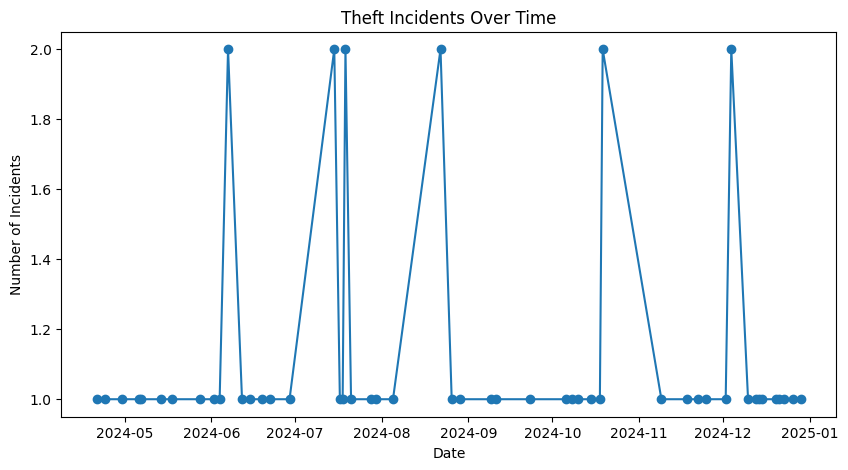

In [20]:
Theft_2024['Date'] = pd.to_datetime(Theft_2024['Date'])
theft_over_time = Theft_2024.groupby(Theft_2024['Date'].dt.date).size()

plt.figure(figsize=(10, 5))
theft_over_time.plot(kind='line', marker='o')
plt.title('Theft Incidents Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Incidents')
plt.show()

INSIGTHS 

The diagram illustrates a consistent pattern of theft incidents resulting in arrests over time, suggesting that such crimes occur regularly and continue to be a significant concern for law enforcement

# 5. Distribution of not arrested domestic theft in 2024

In [22]:
Crime_2024 = Crime[Crime['Year']==2024]
Domestic_2024 = Crime_2024[Crime_2024['Domestic']==True]
Not_arrest_2024 = Domestic_2024[Domestic_2024['Arrest']==False]
Not_arrested_theft_2024 = Not_arrest_2024[Not_arrest_2024['Primary Type']=='THEFT']

In [23]:
mymap_arrested_theft_2024 = folium.Map(location=(41.75,-87.6), zoom_start=10)
locations = Not_arrested_theft_2024[['Latitude', 'Longitude']].dropna()

heat_data = [[row['Latitude'], row['Longitude']] for index, row in locations.iterrows()]
HeatMap(heat_data).add_to(mymap_arrested_theft_2024)

mymap_arrested_theft_2024

INSIGTHS

The heatmap reveals 1,907 theft incidents in 2024 that did not lead to arrests, with a significant concentration in Chicago’s South and West Sides. This indicates potential hotspots where theft is prevalent but law enforcement responses may be limited

# 6. Distribution of Arrested theft in Wards.

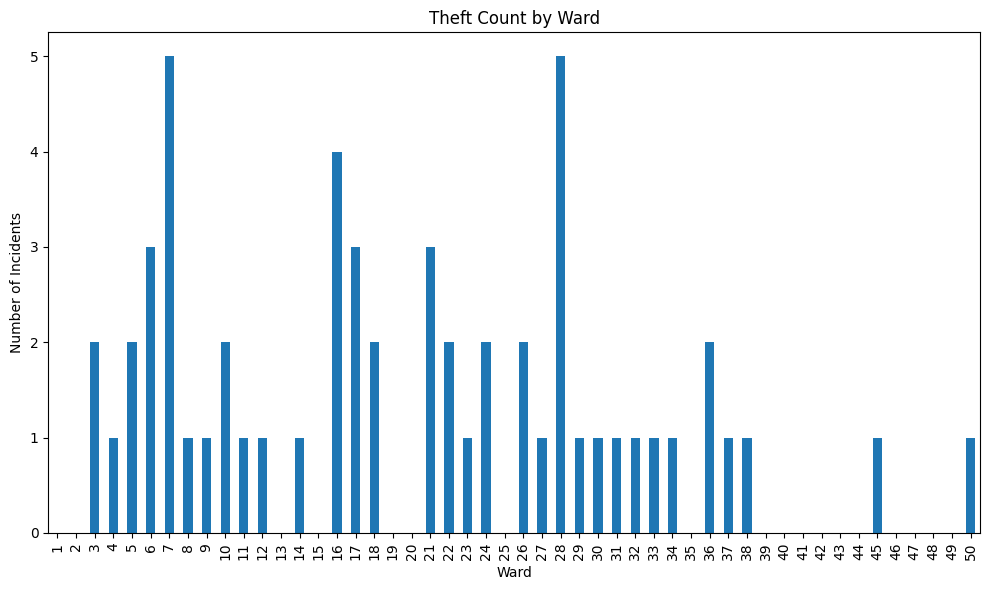

In [25]:
plt.figure(figsize=(10, 6))
Theft_2024['Ward'].value_counts().sort_index().plot(kind='bar')
plt.title('Theft Count by Ward')
plt.xlabel('Ward')
plt.ylabel('Number of Incidents')
plt.tight_layout()
plt.show()

INSIGTHS

Wards 7 and 8 report the highest number of theft-related arrests, likely due to their higher population density, which may contribute to increased opportunities for such crimes

# 7. What Location has most theft that is n ot arrested?

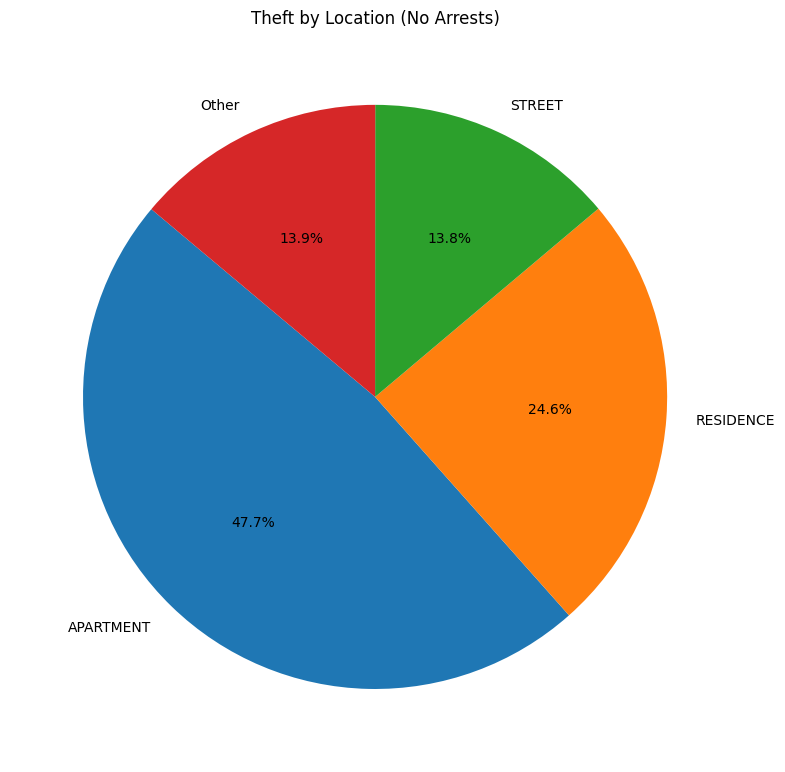

In [27]:
# Calculate value counts
location_counts = Not_arrested_theft_2024['Location Description'].value_counts()

# Filter out categories with less than 5% and group them into "Other"
threshold = location_counts.sum() * 0.05
filtered_counts = location_counts[location_counts >= threshold]
other_count = location_counts[location_counts < threshold].sum()

# Add "Other" category
filtered_counts['Other'] = other_count

# Plot the pie chart
plt.figure(figsize=(8, 8))
filtered_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title('Theft by Location (No Arrests)')
plt.ylabel('')
plt.tight_layout()
plt.show()

INSIGTHS

Apartment has most incidents of unarrested theft making them more prone to thefts in the future

# 8. What distrct has most incidents of theft that is not arrested.

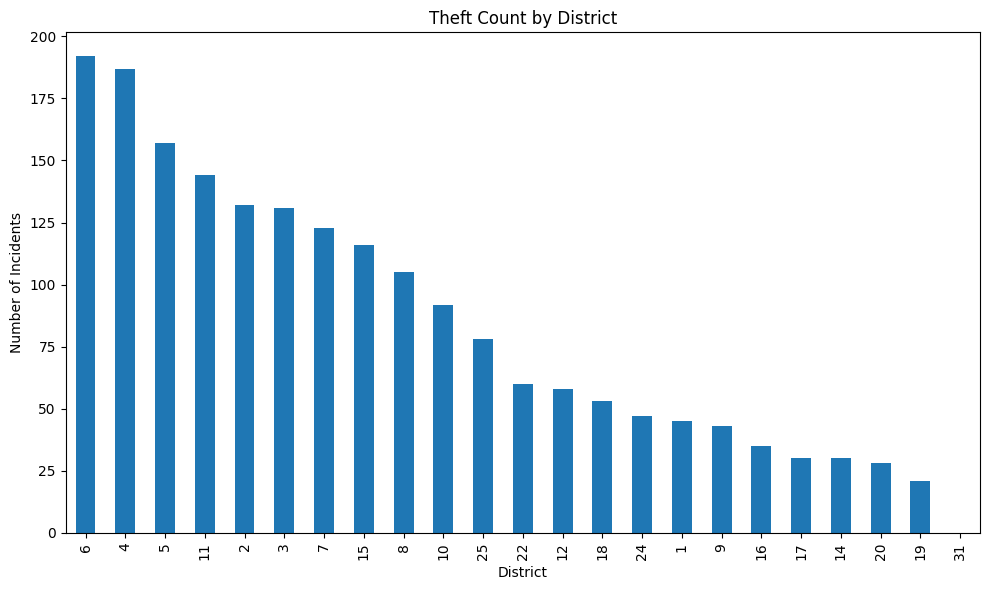

In [29]:
plt.figure(figsize=(10, 6))
Not_arrested_theft_2024['District'].value_counts().plot(kind='bar')
plt.title('Theft Count by District')
plt.xlabel('District')
plt.ylabel('Number of Incidents')
plt.tight_layout()
plt.show()

INSIGTHS 

District 6 has most incidents of unarrested theft  making the theft more frequent

# 9. Incidents of theft that is not arrested over time

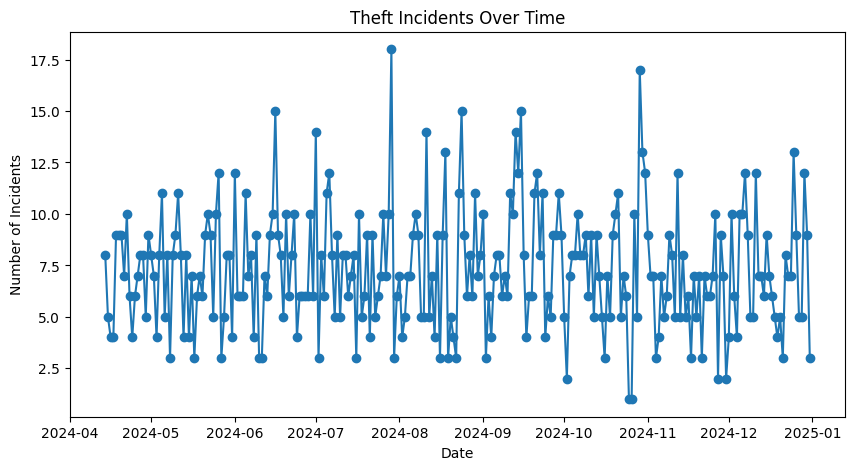

In [30]:
Not_arrested_theft_2024['Date'] = pd.to_datetime(Not_arrested_theft_2024['Date'])
theft_over_time = Not_arrested_theft_2024.groupby(Not_arrested_theft_2024['Date'].dt.date).size()

plt.figure(figsize=(10, 5))
theft_over_time.plot(kind='line', marker='o')
plt.title('Theft Incidents Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Incidents')
plt.show()

INSIGTHS

The data shows a consistent pattern of unresolved incidents over time, indicating ongoing theft occurrences without significant intervention or resolution

# 10. What ward has most unresolved incidents of theft?

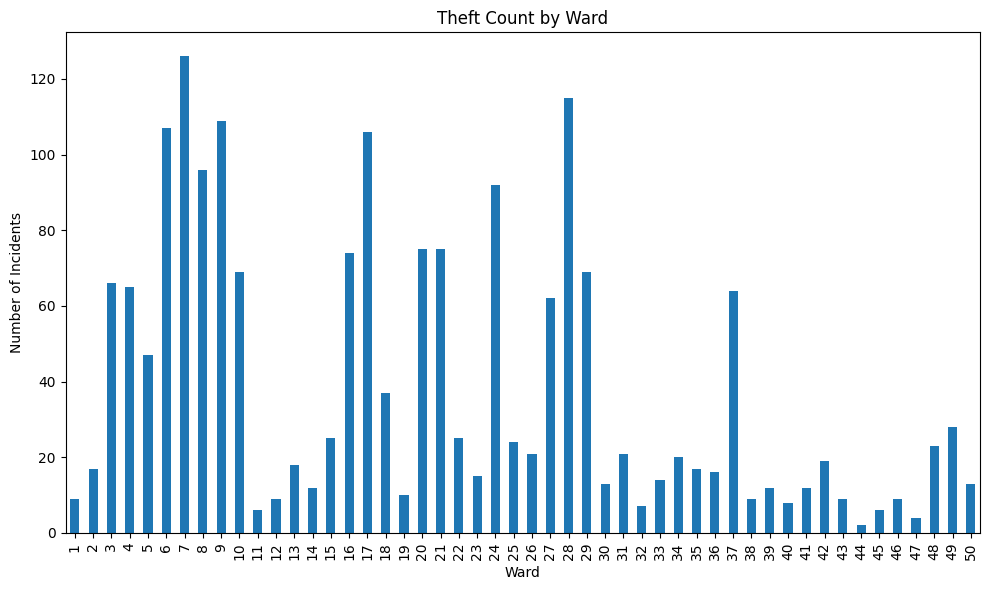

In [31]:
plt.figure(figsize=(10, 6))
Not_arrested_theft_2024['Ward'].value_counts().sort_index().plot(kind='bar')
plt.title('Theft Count by Ward')
plt.xlabel('Ward')
plt.ylabel('Number of Incidents')
plt.tight_layout()
plt.show()

INSIGTHS

Ward 7 records the highest number of unresolved theft cases, indicating a significant challenge in closing theft-related investigations in that area.

# 11. Distribution of incidents of theft in 2024

In [32]:
Crime_2024 = Crime[Crime['Year']==2024]
Domestic_2024 = Crime_2024[Crime_2024['Domestic']==True]
New_Theft_2024 = Domestic_2024[Domestic_2024['Primary Type']=='THEFT']

theft = folium.Map(location=(41.75,-87.6), zoom_start=10)
locations1 = New_Theft_2024[['Latitude', 'Longitude']].dropna()

heat_data1 = [[row['Latitude'], row['Longitude']] for index, row in locations1.iterrows()]
HeatMap(heat_data1).add_to(theft)

theft

INSIGTHS

High-Density Areas : The heatmap shows intense red and orange regions, indicating areas with the highest concentration of theft incidents. These areas are primarily located in the central and northern parts of the city

# 12. Arrested vs not arrested

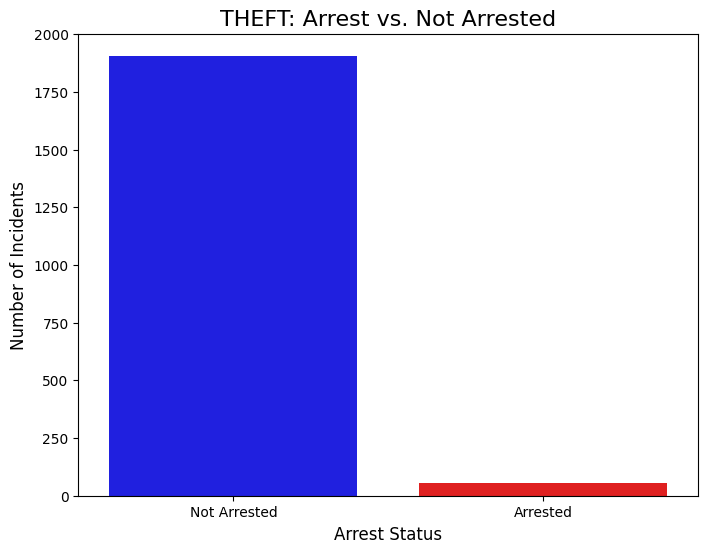

In [34]:
arrest_counts = New_Theft_2024['Arrest'].value_counts()

arrest_df = arrest_counts.reset_index()
arrest_df.columns = ['Arrest', 'Count']
arrest_df['Arrest'] = arrest_df['Arrest'].map({True: 'Arrested', False: 'Not Arrested'})

plt.figure(figsize=(8, 6))
sns.barplot(data=arrest_df, x='Arrest', y='Count', palette=['blue', 'red'])
plt.title('THEFT: Arrest vs. Not Arrested', fontsize=16)
plt.xlabel('Arrest Status', fontsize=12)
plt.ylabel('Number of Incidents', fontsize=12)
plt.show()

INSIGTHS

Not arrested incidents of theft is completely more than arested which is 1907 out of 1964 of all domestic incidents of theft in 2024

# 13. Percentage of Arrested vs not arrested

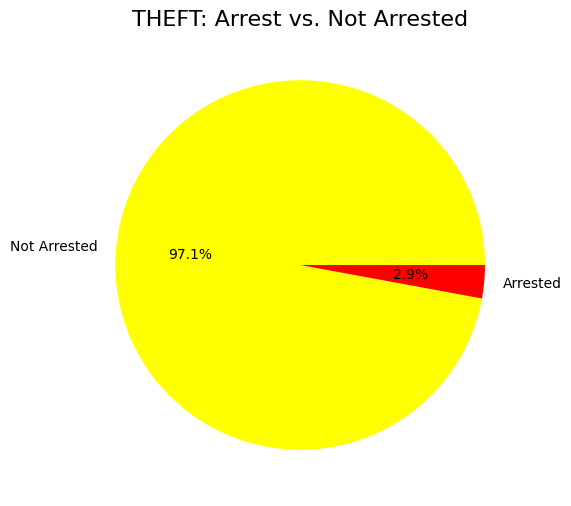

In [37]:
plt.figure(figsize=(8, 6))
plt.pie(arrest_df['Count'], labels=arrest_df['Arrest'], autopct='%1.1f%%', colors=['yellow', 'red'])
plt.title('THEFT: Arrest vs. Not Arrested', fontsize=16)

plt.show()

INSIGTHS

Not arrested incidents of Dommestic theft is 97% of all domestic incidents of theft in 2024 making theft more likelt unresolve

# 14. Not arrested and arrested number of incidents in Districts

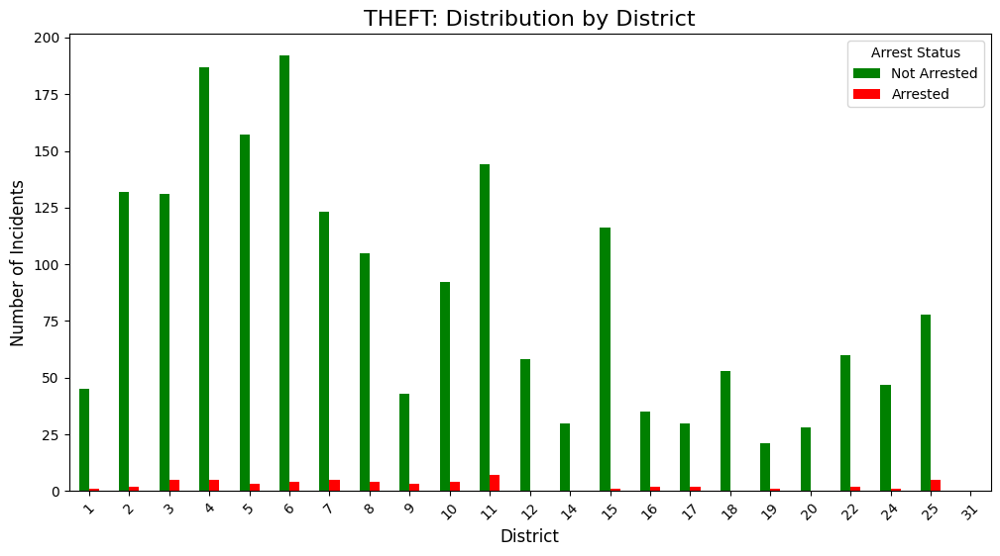

In [38]:
# Group by District and Arrest status
district_arrests = New_Theft_2024.groupby(['District', 'Arrest']).size().unstack(fill_value=0)
district_arrests = district_arrests.rename(columns={True: 'Arrested', False: 'Not Arrested'})

# Plot stacked bar chart
district_arrests.plot(kind='bar', figsize=(12, 6), color=['green', 'red'])
plt.title('THEFT: Distribution by District', fontsize=16)
plt.xlabel('District', fontsize=12)
plt.ylabel('Number of Incidents', fontsize=12)
plt.legend(title='Arrest Status')
plt.xticks(rotation=45)
plt.show()

INSIGTHS

The data shows  district 6 has most not arrested domestic incidents of theft and district 11 has most arrested theft incidents

# 15. Arrested and Not arrested over time

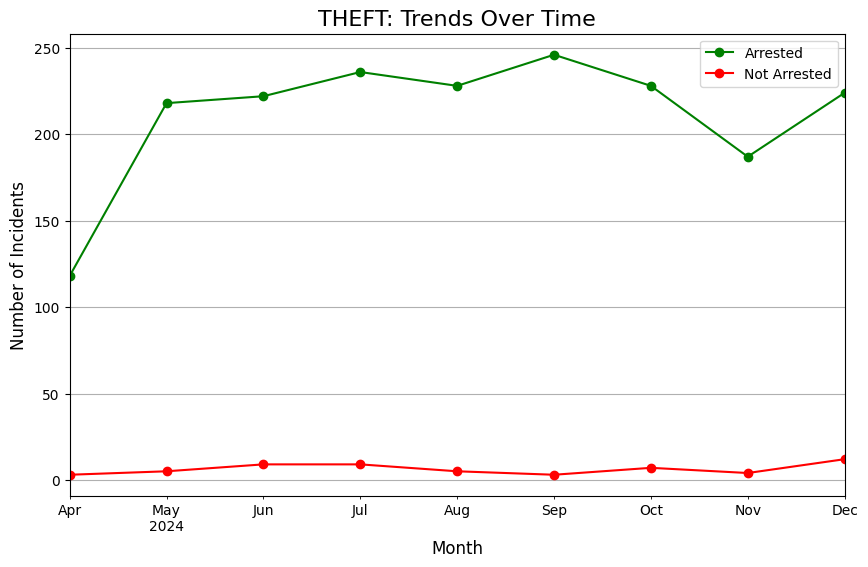

In [39]:
New_Theft_2024['Date'] = pd.to_datetime(New_Theft_2024['Date'])
time_series = New_Theft_2024.groupby([New_Theft_2024['Date'].dt.to_period('M'), 'Arrest']).size().unstack(fill_value=0)
time_series.index = time_series.index.to_timestamp() 


plt.figure(figsize=(10, 6))
time_series.plot(kind='line', marker='o', color=['green', 'red'], ax=plt.gca())
plt.title('THEFT: Trends Over Time', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Incidents', fontsize=12)
plt.legend(['Arrested', 'Not Arrested'])
plt.grid(True)
plt.show()

INSIGTHS

The figure shows consistent number of arrested and not arrested incident of theft

# 16. What place do theft mostly occur?

In [42]:
pip install geopandas

Note: you may need to restart the kernel to use updated packages.


In [45]:
pip install contextily

   ---------------------------------------- 0.0/25.5 MB ? eta -:--:--
   ---- ----------------------------------- 3.1/25.5 MB 37.0 MB/s eta 0:00:01
   ------ --------------------------------- 4.2/25.5 MB 13.2 MB/s eta 0:00:02
   ----------- ---------------------------- 7.3/25.5 MB 12.6 MB/s eta 0:00:02
   ------------ --------------------------- 8.1/25.5 MB 9.2 MB/s eta 0:00:02
   --------------------- ------------------ 13.6/25.5 MB 13.0 MB/s eta 0:00:01
   --------------------- ------------------ 13.6/25.5 MB 13.0 MB/s eta 0:00:01
   --------------------------- ------------ 17.6/25.5 MB 11.4 MB/s eta 0:00:01
   ------------------------------- -------- 19.9/25.5 MB 11.9 MB/s eta 0:00:01
   ------------------------------------- -- 23.6/25.5 MB 12.0 MB/s eta 0:00:01
   ---------------------------------------- 25.5/25.5 MB 12.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


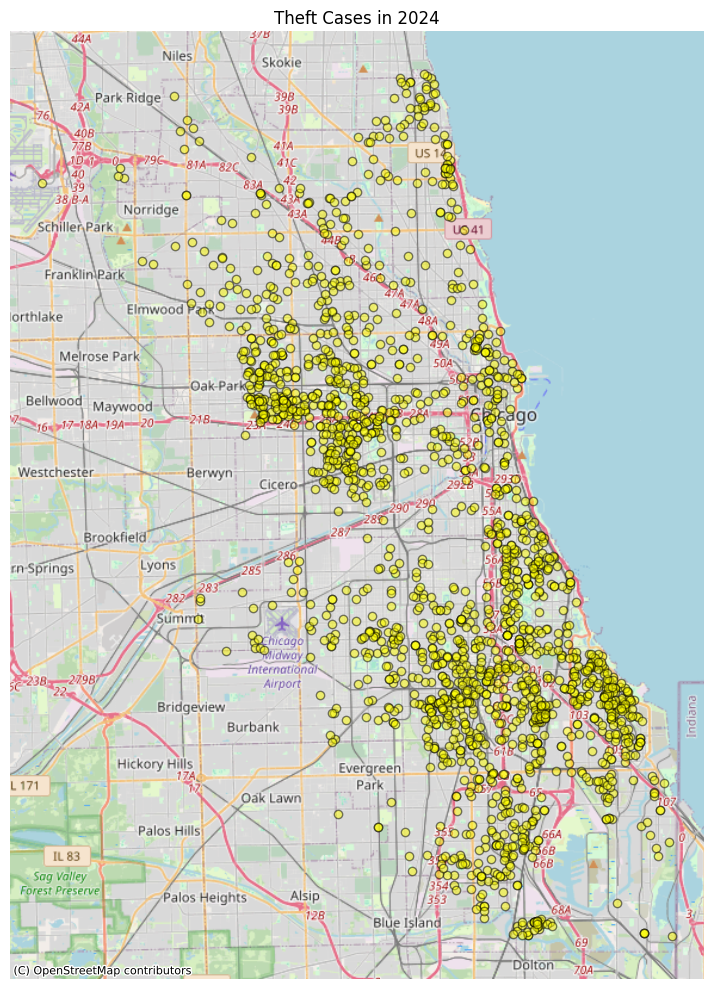

In [49]:
import geopandas as gpd
from shapely.geometry import Point
import contextily as ctx


geometry = [Point(xy) for xy in zip(New_Theft_2024['Longitude'], New_Theft_2024['Latitude'])]
geo_df = gpd.GeoDataFrame(New_Theft_2024, geometry=geometry, crs='EPSG:4326')  # WGS84


geo_df = geo_df.to_crs(epsg=3857)


fig, ax = plt.subplots(figsize=(10, 10))
geo_df.plot(ax=ax, color='yellow', alpha=0.5, edgecolor='black')

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik) 
ax.set_title('Theft Cases in 2024')
ax.set_axis_off() 
plt.tight_layout()
plt.show()

INSIGTHS  

The plot shows several dense clusters of red dots, indicating areas with a high frequency of domestic thefts. These clusters are particularly noticeable in the central and northern regions of the plotted area

# 17. What location is theft consistent?

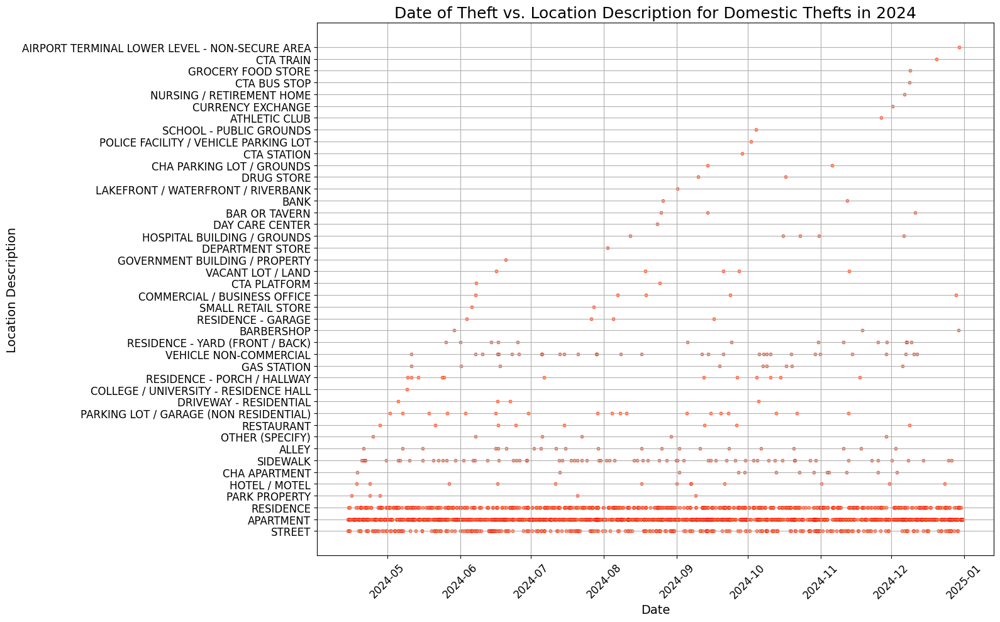

In [51]:
plt.figure(figsize=(16, 10)) 
plt.scatter(New_Theft_2024['Date'], New_Theft_2024['Location Description'], alpha=0.6, color='orange', s=10, edgecolor='red')

plt.title('Date of Theft vs. Location Description for Domestic Thefts in 2024', fontsize=18)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Location Description', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

INSIGTHS

Apartment, residential and street area has the most consistent of theft over time

# 18. What community does theft mostly occur?

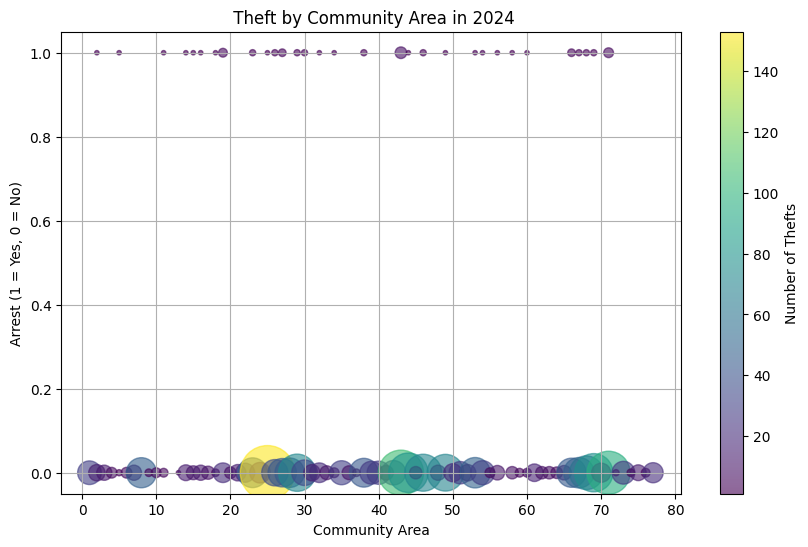

In [52]:
arrest_by_area = New_Theft_2024.groupby(['Community Area', 'Arrest']).size().reset_index(name='Count')

plt.figure(figsize=(10, 6))
plt.scatter(arrest_by_area['Community Area'], arrest_by_area['Arrest'], s=arrest_by_area['Count']*10, alpha=0.6, c=arrest_by_area['Count'], cmap='viridis')
plt.colorbar(label='Number of Thefts')
plt.title(' Theft by Community Area in 2024')
plt.xlabel('Community Area')
plt.ylabel('Arrest (1 = Yes, 0 = No)')
plt.grid(True)
plt.show()

INSIGTHS

The diagram shows that most theft that occur in community area between 20 and 30 has most theft that the burglar is not arrested

# 19. When does theft mostly occur?

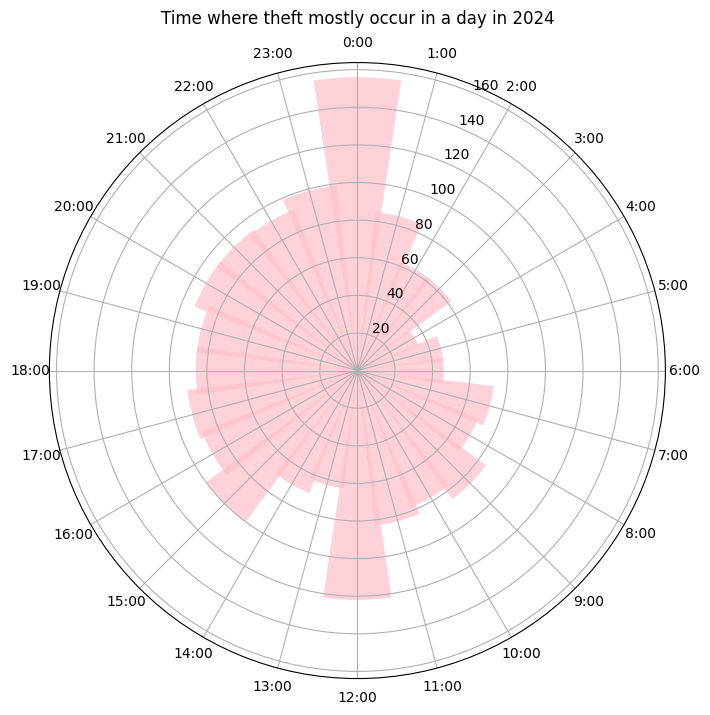

In [55]:
# Extract hour from the 'Date' column
New_Theft_2024['Hour'] = pd.to_datetime(New_Theft_2024['Date']).dt.hour

# Group data by hour and count occurrences
theft_by_hour = New_Theft_2024.groupby('Hour').size()

# Create radial plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': 'polar'})

theta = np.linspace(0, 2 * np.pi, len(theft_by_hour), endpoint=False)
bars = ax.bar(theta, theft_by_hour, width=0.3, color='pink', alpha=0.7)

# Set 12:00 at the top and rotate clockwise
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)

# Add hour labels
ax.set_xticks(theta)
ax.set_xticklabels([f'{h}:00' for h in theft_by_hour.index])

ax.set_title('Time where theft mostly occur in a day in 2024', va='bottom')
plt.show()

INSIGTHS

The graph indicates that theft incidents peak around midnight, suggesting that late-night hours are the most vulnerable time for such crimes to occur

# 20. Distribution of arrested and not arrested in diffrent locations.

In [58]:
pip install plotly.express

Note: you may need to restart the kernel to use updated packages.


In [60]:
import plotly.express as px

# 1. Convert Arrest to readable labels
New_Theft_2024['Arrest Label'] = New_Theft_2024['Arrest'].apply(lambda x: 'Arrest' if x else 'No Arrest')

# 2. Calculate total counts per Location Description
location_counts = New_Theft_2024['Location Description'].value_counts(normalize=True)

# 3. Map categories with <5% to 'Other'
New_Theft_2024['Location Grouped'] = New_Theft_2024['Location Description'].apply(
    lambda x: x if location_counts[x] >= 0.01 else 'Other'
)

# 4. Group by new categories
sunburst_data = New_Theft_2024.groupby(['Location Grouped', 'Arrest Label']).size().reset_index(name='Count')

# 5. Create Sunburst chart
fig = px.sunburst(
    sunburst_data,
    path=['Location Grouped', 'Arrest Label'],
    values='Count',
    title='Theft Distribution by Location and Arrest in 2024'
)

fig.update_layout(margin=dict(t=50, l=0, r=0, b=0))
fig.show()

INSIGTHS 

The graph shows, most cases of theft has no arrest happend'

 # ARSON

# 21. Distribution of Arson

In [62]:
New_Crime_2024 = Crime[Crime['Year']==2024]
Arson_2024 = New_Crime_2024[New_Crime_2024['Primary Type']=='ARSON']

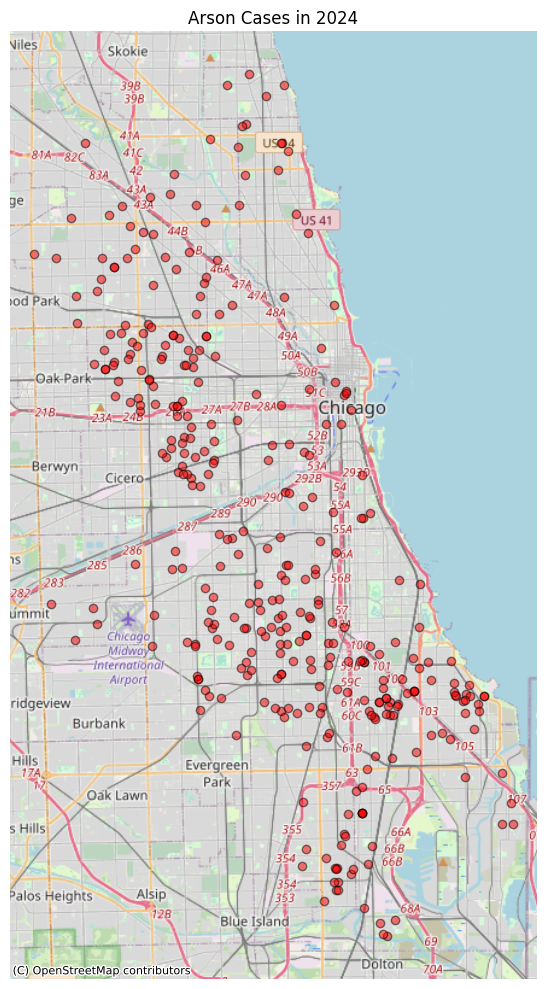

In [64]:
geometry_arson = [Point(xy) for xy in zip(Arson_2024['Longitude'], Arson_2024['Latitude'])]
geo_df_arson = gpd.GeoDataFrame(Arson_2024, geometry=geometry_arson, crs='EPSG:4326') 


geo_df_arson = geo_df_arson.to_crs(epsg=3857)


fig, ax = plt.subplots(figsize=(10, 10))
geo_df_arson.plot(ax=ax, color='red', alpha=0.5, edgecolor='black')

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik) 
ax.set_title('Arson Cases in 2024')
ax.set_axis_off() 
plt.tight_layout()
plt.show()

INSIGTHS 

The majority of the red dots are concentrated within the urban core of Chicago, particularly in the central and southern parts of the city

# 22. How consistent is arson in different locations.

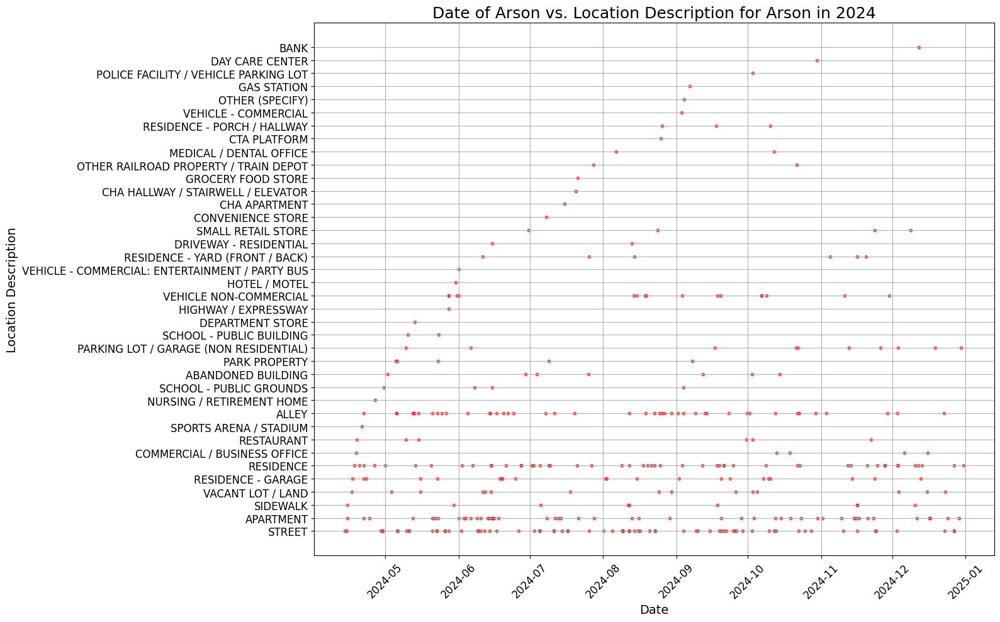

In [65]:
plt.figure(figsize=(16, 10)) 
plt.scatter(Arson_2024['Date'], Arson_2024['Location Description'], alpha=0.6, color='red', s=10)

plt.title('Date of Arson vs. Location Description for Arson in 2024', fontsize=18)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Location Description', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

INSIGTHS

Arson incidents in 2024 were distributed across various locations, with the most frequent occurrences at residential properties (e.g., apartments, streets, and garages), followed by commercial areas like parking lots/garages and convenience stores, while less common targets included critical infrastructure such as banks, police facilities, and schools

# 23. Do person that did arson arrested or not arrested?

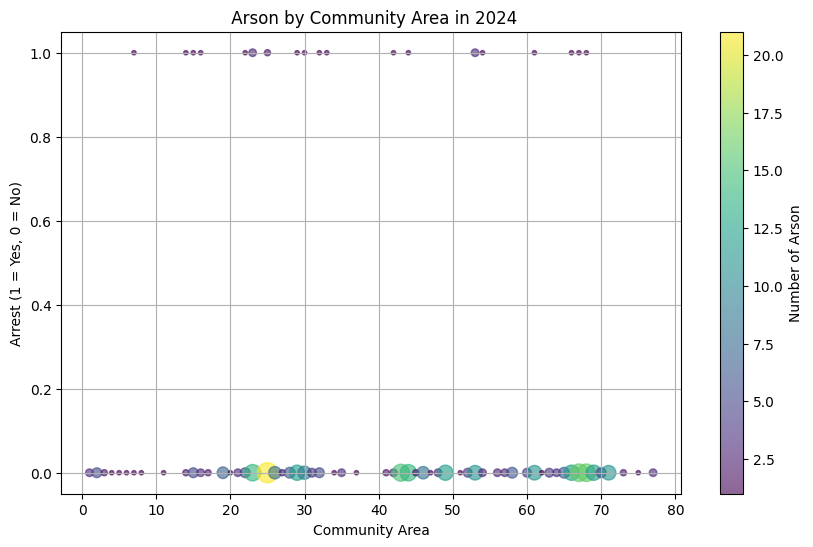

In [66]:
arson_arrest_by_area = Arson_2024.groupby(['Community Area', 'Arrest']).size().reset_index(name='Count')

plt.figure(figsize=(10, 6))
plt.scatter(arson_arrest_by_area['Community Area'], arson_arrest_by_area['Arrest'], s=arson_arrest_by_area['Count']*10, alpha=0.6, c=arson_arrest_by_area['Count'], cmap='viridis')
plt.colorbar(label='Number of Arson')
plt.title(' Arson by Community Area in 2024')
plt.xlabel('Community Area')
plt.ylabel('Arrest (1 = Yes, 0 = No)')
plt.grid(True)
plt.show()

INSIGTHS 

Most arson incidents appear to have resulted in no arrests

# 24. What time do arson mostly occur?

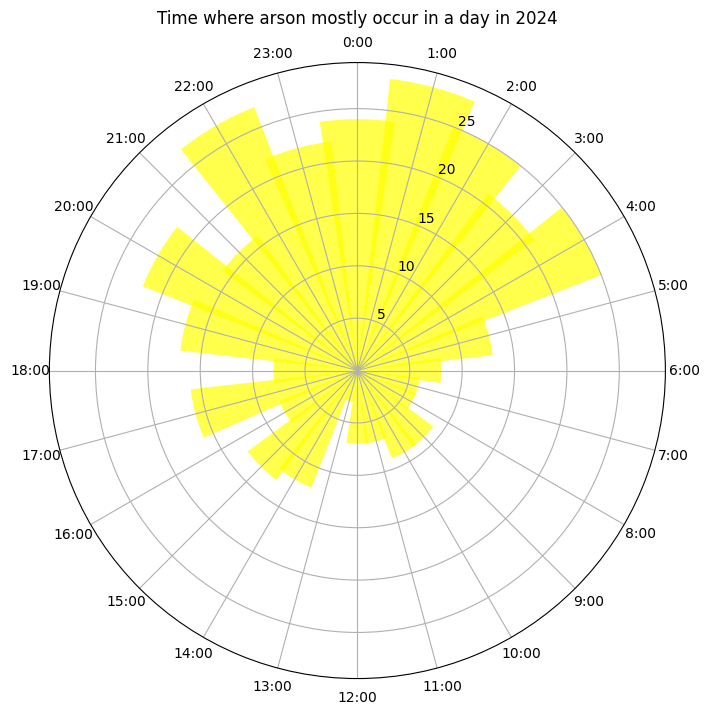

In [68]:
# Extract hour from the 'Date' column
Arson_2024['Hour'] = pd.to_datetime(Arson_2024['Date']).dt.hour

# Group data by hour and count occurrences
arson_by_hour = Arson_2024.groupby('Hour').size()

# Create radial plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': 'polar'})

theta = np.linspace(0, 2 * np.pi, len(arson_by_hour), endpoint=False)
bars = ax.bar(theta, arson_by_hour, width=0.3, color='YELLOW', alpha=0.7)

# Set 12:00 at the top and rotate clockwise
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)

# Add hour labels
ax.set_xticks(theta)
ax.set_xticklabels([f'{h}:00' for h in arson_by_hour.index])

ax.set_title('Time where arson mostly occur in a day in 2024', va='bottom')
plt.show()


INSIGTHS

Arson incidents in 2024 predominantly occurred during late-night hours (around 1:00 AM) and early morning hours (around 5:00 AM), with significantly fewer cases during daylight hours

# 25. Arrested and not arrested distribution of arson incidents

In [69]:
import plotly.express as px

# 1. Convert Arrest to readable labels
Arson_2024['Arrest Label'] = Arson_2024['Arrest'].apply(lambda x: 'Arrest' if x else 'No Arrest')

# 2. Calculate total counts per Location Description
location_counts1 = Arson_2024['Location Description'].value_counts(normalize=True)

# 3. Map categories with <3% to 'Other'
Arson_2024['Location Grouped'] = Arson_2024['Location Description'].apply(
    lambda x: x if location_counts1[x] >= 0.03 else 'Other'
)

# 4. Group by new categories
sunburst_data1 = Arson_2024.groupby(['Location Grouped', 'Arrest Label']).size().reset_index(name='Count')

# 5. Create Sunburst chart
fig = px.sunburst(
    sunburst_data1,
    path=['Location Grouped', 'Arrest Label'],
    values='Count',
    title='Arson Distribution by Location and Arrest in 2024'
)

fig.update_layout(margin=dict(t=50, l=0, r=0, b=0))
fig.show()

INSIGTHS

The largest categories are Streets and Other locations, both with a significant number of cases where no arrests were made. Residences, apartments, and alleys also account for notable shares, but arrests are rare across all categories. This highlights that most arson incidents occurred in public or residential areas without leading to arrests

# 26. Monthly trends of arson

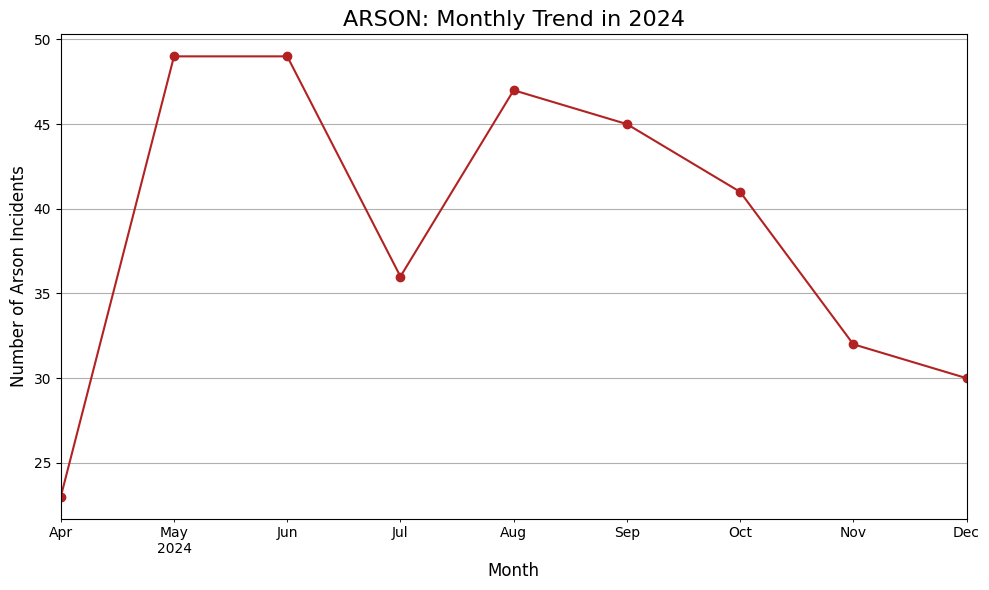

In [71]:
time_series_arson = Arson_2024.groupby(Arson_2024['Date'].dt.to_period('M')).size()
time_series_arson.index = time_series_arson.index.to_timestamp() 

plt.figure(figsize=(10, 6))
time_series_arson.plot(kind='line', marker='o', color='firebrick', ax=plt.gca())
plt.title('ARSON: Monthly Trend in 2024', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of Arson Incidents', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

INSIGTHS

most arson happen in may and june as it is warmer weather condition

# LIQUOR

#  27. Monthly trends of liquor violation

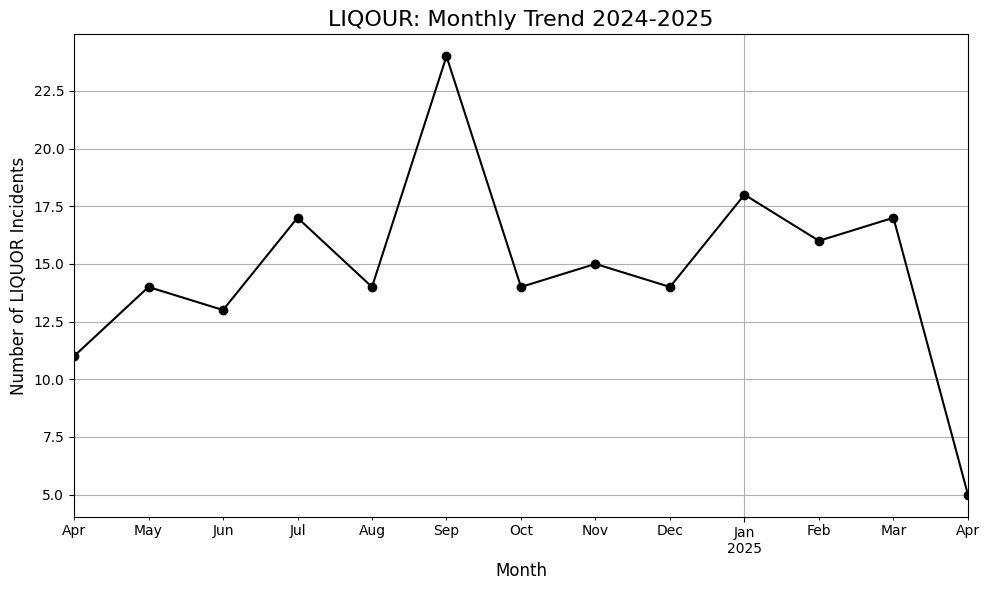

In [72]:
Liquor = Crime[Crime['Primary Type']=='LIQUOR LAW VIOLATION']

time_series_liquor = Liquor.groupby(Liquor['Date'].dt.to_period('M')).size()
time_series_liquor.index = time_series_liquor.index.to_timestamp() 

plt.figure(figsize=(10, 6))
time_series_liquor.plot(kind='line', marker='o', color='black', ax=plt.gca())
plt.title('LIQOUR: Monthly Trend 2024-2025', fontsize=16)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Number of LIQUOR Incidents', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

INSIGTS

This graph show thw result according to the theories of the problem and vishualized it 

# 28. Distribution of Liquor violation

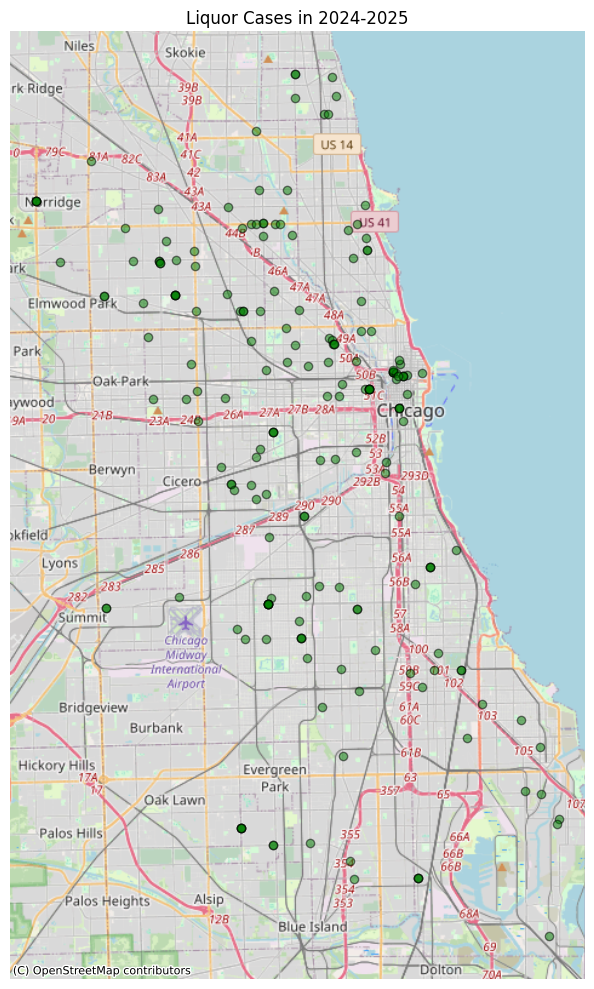

In [74]:
geometry_liquor = [Point(xy) for xy in zip(Liquor['Longitude'], Liquor['Latitude'])]
geo_df_liquor = gpd.GeoDataFrame(Liquor, geometry=geometry_liquor, crs='EPSG:4326') 


geo_df_liquor = geo_df_liquor.to_crs(epsg=3857)


fig, ax = plt.subplots(figsize=(10, 10))
geo_df_liquor.plot(ax=ax, color='green', alpha=0.5, edgecolor='black')

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik) 
ax.set_title('Liquor Cases in 2024-2025')
ax.set_axis_off() 
plt.tight_layout()
plt.show()

INSIGTHS

The majority of red dots (representing liquor cases) are concentrated within the urban core of Chicago, particularly in the central and southern parts of the city.This suggests that liquor-related incidents are more prevalent in densely populated urban areas, which could be due to higher population density, increased social activity, or other socio-economic factors



# 29. Where do liquor violation occur?

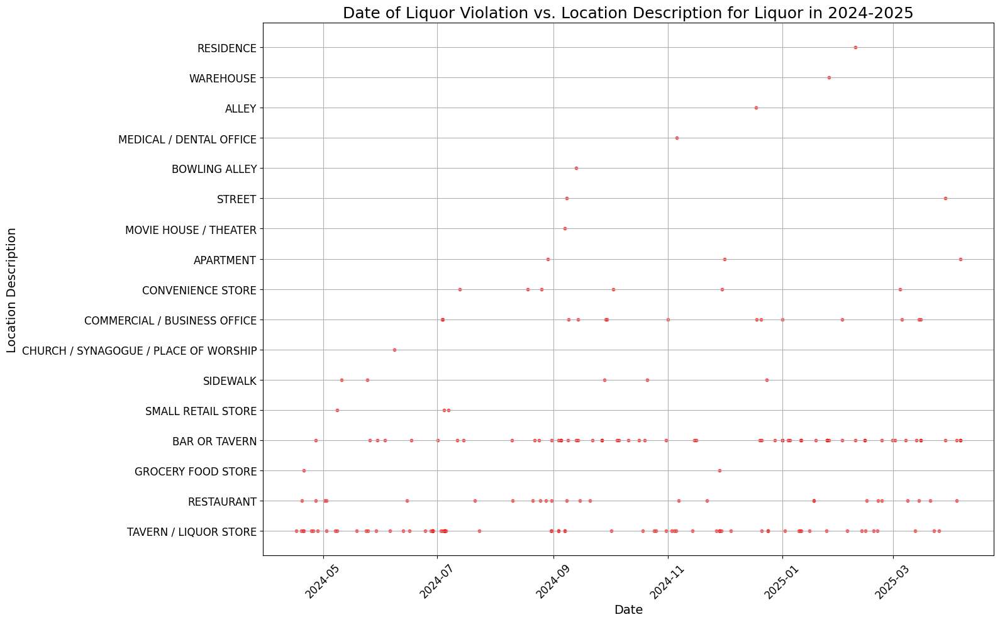

In [75]:
plt.figure(figsize=(16, 10)) 
plt.scatter(Liquor['Date'], Liquor['Location Description'], alpha=0.6, color='red', s=10)

plt.title('Date of Liquor Violation vs. Location Description for Liquor in 2024-2025', fontsize=18)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Location Description', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

INSIGTHS

most liquor violation happen in liquor store where liquor can be purchase suggesting that Hhgher volume increases the likelihood of violations, such as selling to minors, selling after legal hours, or license-related infractions

# 30. What time most liquor violation happen?

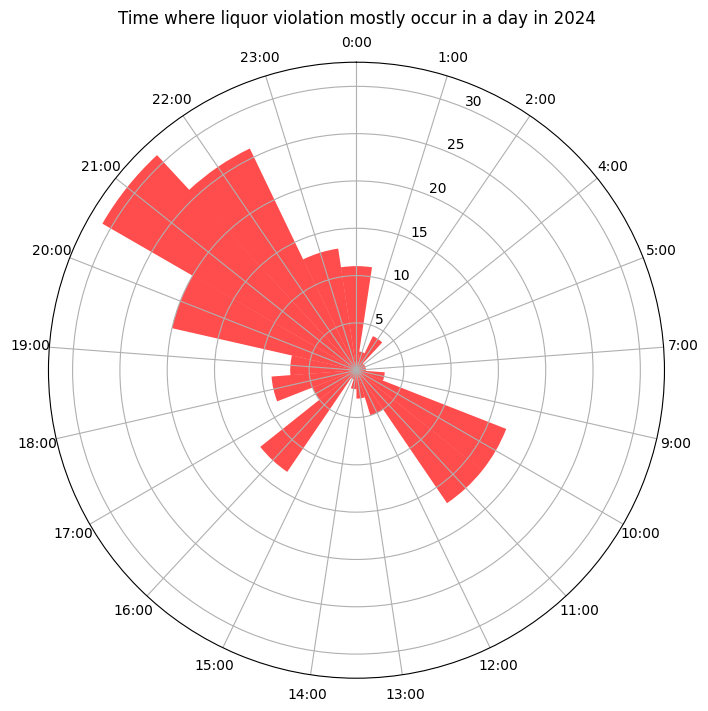

In [76]:
# Extract hour from the 'Date' column
Liquor['Hour'] = pd.to_datetime(Liquor['Date']).dt.hour

# Group data by hour and count occurrences
liquor_by_hour = Liquor.groupby('Hour').size()

# Create radial plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': 'polar'})

theta = np.linspace(0, 2 * np.pi, len(liquor_by_hour), endpoint=False)
bars = ax.bar(theta, liquor_by_hour, width=0.3, color='red', alpha=0.7)

# Set 12:00 at the top and rotate clockwise
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)

# Add hour labels
ax.set_xticks(theta)
ax.set_xticklabels([f'{h}:00' for h in liquor_by_hour.index])

ax.set_title('Time where liquor violation mostly occur in a day in 2024', va='bottom')
plt.show()

INSITGHS

the graph shows that most liquor violation happen in night which is 9:00 PM

# 31. Distribution of Arrest and No Arrest in Liquor violation

In [77]:
import plotly.express as px

# 1. Convert Arrest to readable labels
Liquor['Arrest Label'] = Liquor['Arrest'].apply(lambda x: 'Arrest' if x else 'No Arrest')

# 2. Calculate total counts per Location Description
location_counts2 = Liquor['Location Description'].value_counts(normalize=True)

# 3. Map categories with <3% to 'Other'
Liquor['Location Grouped'] = Liquor['Location Description'].apply(
    lambda x: x if location_counts2[x] >= 0.03 else 'Other'
)

# 4. Group by new categories
sunburst_data2 = Liquor.groupby(['Location Grouped', 'Arrest Label']).size().reset_index(name='Count')

# 5. Create Sunburst chart
fig = px.sunburst(
    sunburst_data2,
    path=['Location Grouped', 'Arrest Label'],
    values='Count',
    title='Liquor violation Distribution by Location and Arrest in 2024'
)

fig.update_layout(margin=dict(t=50, l=0, r=0, b=0))
fig.show()

INSIGTHS

The graph shows that the majority of liquor violation cases result in arrests, suggesting that strict enforcement by authorities may be contributing to a lower occurrence of such offenses